# Task 1A — zero-shot human↔mouse tissue correspondence

Primary report for the corrected, fully unseen ENCODE cohort. The complete benchmark contains **17 expression-ready mouse profiles across 11 tissues**; the robustness analysis contains **11 profiles across five tissues with at least two independent experiments**. Same-study and exact-sample exposed experiments are excluded. No fine-tuning, batch correction, species centering, alignment, or extra normalization is used.

Reproduce with:
```bash
.venv/bin/python benchmarks/mouse_encode/pipeline/run_task1a_expanded.py --device cuda:0 --batch-size 4
```

In [1]:
from pathlib import Path
import pandas as pd
from IPython.display import Image, display
HERE = Path.cwd()
if not (HERE / 'results').exists(): HERE = Path('benchmarks/mouse_encode')
R = HERE / 'results'
F = R / 'figures' / 'expanded_task1a'
manifest = pd.read_parquet(R / 'expanded_task1a_sample_manifest.parquet')
metrics = pd.read_csv(R / 'expanded_task1a_metrics.csv')
per_tissue = pd.read_csv(R / 'expanded_task1a_per_tissue_metrics.csv')
centroid_ranks = pd.read_csv(R / 'expanded_task1a_centroid_rankings.csv')
pcs = pd.read_csv(R / 'expanded_task1a_pc1_20_associations.csv')

## Cohort

The analysis unit on the mouse side is one independent ENCODE experiment-level quantification. Mouse centroids give every experiment equal weight. GTEx mappings use the predefined direct anatomical correspondences.

In [2]:
cohort = manifest.groupby(['species','tissue'], observed=True).size().unstack(fill_value=0)
display(cohort.style.format('{:,}'))
print('Human samples:', (manifest.species == 'human').sum())
print('Mouse profiles:', (manifest.species == 'mouse').sum())

tissue,adrenal,cerebellum,heart,liver,lung,mammary gland,ovary,spleen,stomach,subcutaneous adipose,testis
species,,,,,,,,,,,
human,250,236,823,222,532,445,173,239,347,632,361
mouse,1,1,2,2,2,1,1,3,1,1,2


Human samples: 4260
Mouse profiles: 17


## Main retrieval results

Top-1 is sample-weighted; macro Top-1 gives each tissue equal weight. MRR is the reciprocal rank of the predefined anatomical match. Chance Top-1 is 9.1% for 11 tissues and 20.0% for five tissues.

Cohort,Representation,Direction,Queries,Top-1,MRR,Macro tissue Top-1,Macro tissue MRR
complete_11_tissue,raw_expression,human_to_mouse,4260,61.7%,70.3%,53.8%,64.3%
complete_11_tissue,raw_expression,mouse_to_human,17,88.2%,92.6%,81.8%,88.6%
complete_11_tissue,joint_pca,human_to_mouse,4260,80.1%,87.1%,79.4%,86.8%
complete_11_tissue,joint_pca,mouse_to_human,17,82.4%,88.7%,77.3%,86.0%
complete_11_tissue,bridgerna,human_to_mouse,4260,46.0%,64.0%,46.3%,63.9%
complete_11_tissue,bridgerna,mouse_to_human,17,58.8%,69.7%,63.6%,73.7%
replicated_5_tissue,raw_expression,human_to_mouse,2177,81.1%,86.7%,78.6%,84.7%
replicated_5_tissue,raw_expression,mouse_to_human,11,100.0%,100.0%,100.0%,100.0%
replicated_5_tissue,joint_pca,human_to_mouse,2177,99.7%,99.8%,99.8%,99.9%
replicated_5_tissue,joint_pca,mouse_to_human,11,90.9%,93.9%,90.0%,93.3%


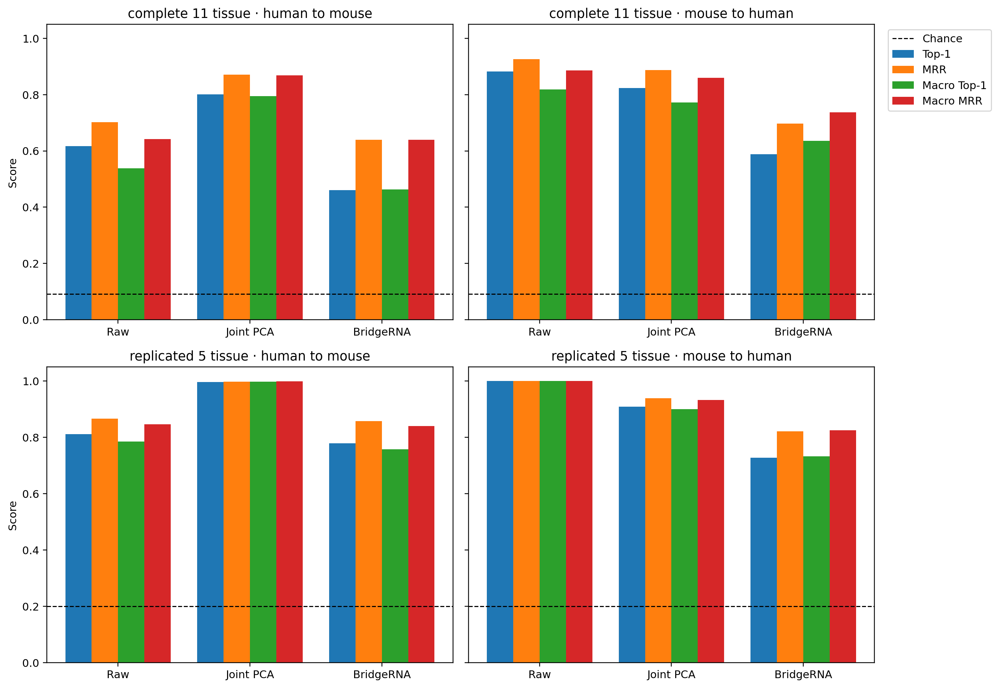

In [3]:
publication = metrics.copy()
for col in ['top1','mrr','macro_tissue_top1','macro_tissue_mrr']:
    publication[col] = publication[col].map(lambda x: f'{x:.1%}')
display(publication.rename(columns={'cohort':'Cohort','representation':'Representation','direction':'Direction','samples':'Queries','top1':'Top-1','mrr':'MRR','macro_tissue_top1':'Macro tissue Top-1','macro_tissue_mrr':'Macro tissue MRR'}).style.hide(axis='index'))
display(Image(filename=str(F / 'retrieval_summary.png'), width=1050))

## Per-tissue performance and correspondence

The tables retain the actual nearest cross-species tissue, the anatomical-match rank, and both cosine similarities. No correspondence was chosen after viewing the embeddings.

In [4]:
display(per_tissue.style.format({'top1':'{:.1%}','mrr':'{:.3f}','median_anatomical_rank':'{:.1f}'}).hide(axis='index'))

cohort,representation,direction,true_tissue,samples,top1,mrr,median_anatomical_rank
complete_11_tissue,raw_expression,human_to_mouse,adrenal,250,0.0%,0.176,6.0
complete_11_tissue,raw_expression,human_to_mouse,subcutaneous adipose,632,99.8%,0.999,1.0
complete_11_tissue,raw_expression,human_to_mouse,cerebellum,236,100.0%,1.000,1.0
complete_11_tissue,raw_expression,human_to_mouse,heart,823,94.2%,0.961,1.0
complete_11_tissue,raw_expression,human_to_mouse,liver,222,98.6%,0.989,1.0
complete_11_tissue,raw_expression,human_to_mouse,lung,532,99.4%,0.997,1.0
complete_11_tissue,raw_expression,human_to_mouse,mammary gland,445,0.0%,0.331,3.0
complete_11_tissue,raw_expression,human_to_mouse,ovary,173,0.0%,0.344,3.0
complete_11_tissue,raw_expression,human_to_mouse,spleen,239,100.0%,1.000,1.0
complete_11_tissue,raw_expression,human_to_mouse,stomach,347,0.0%,0.157,6.0


In [5]:
display(centroid_ranks.style.format({'nearest_cosine':'{:.4f}','anatomical_match_cosine':'{:.4f}'}).hide(axis='index'))

cohort,representation,direction,query_tissue,nearest_cross_species_tissue,anatomical_match_rank,nearest_cosine,anatomical_match_cosine
complete_11_tissue,raw_expression,human_to_mouse,adrenal,subcutaneous adipose,6,0.9156,0.8924
complete_11_tissue,raw_expression,human_to_mouse,subcutaneous adipose,subcutaneous adipose,1,0.9315,0.9315
complete_11_tissue,raw_expression,human_to_mouse,cerebellum,cerebellum,1,0.9385,0.9385
complete_11_tissue,raw_expression,human_to_mouse,heart,heart,1,0.9276,0.9276
complete_11_tissue,raw_expression,human_to_mouse,liver,liver,1,0.9182,0.9182
complete_11_tissue,raw_expression,human_to_mouse,lung,lung,1,0.9421,0.9421
complete_11_tissue,raw_expression,human_to_mouse,mammary gland,subcutaneous adipose,3,0.9363,0.9202
complete_11_tissue,raw_expression,human_to_mouse,ovary,subcutaneous adipose,3,0.9222,0.9085
complete_11_tissue,raw_expression,human_to_mouse,spleen,spleen,1,0.9348,0.9348
complete_11_tissue,raw_expression,human_to_mouse,stomach,subcutaneous adipose,7,0.9271,0.8853


## Confusion matrices

Rows are true query tissues and columns are retrieved cross-species centroids. Each row is normalized independently.

complete_11_tissue · raw_expression · human_to_mouse


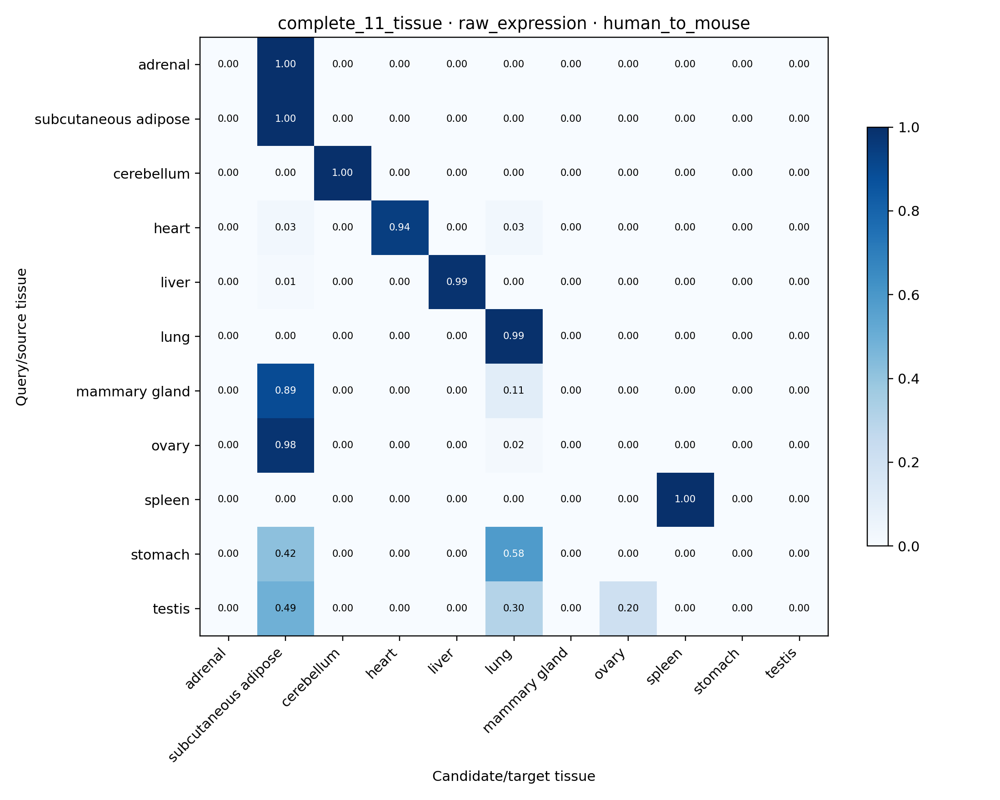

complete_11_tissue · raw_expression · mouse_to_human


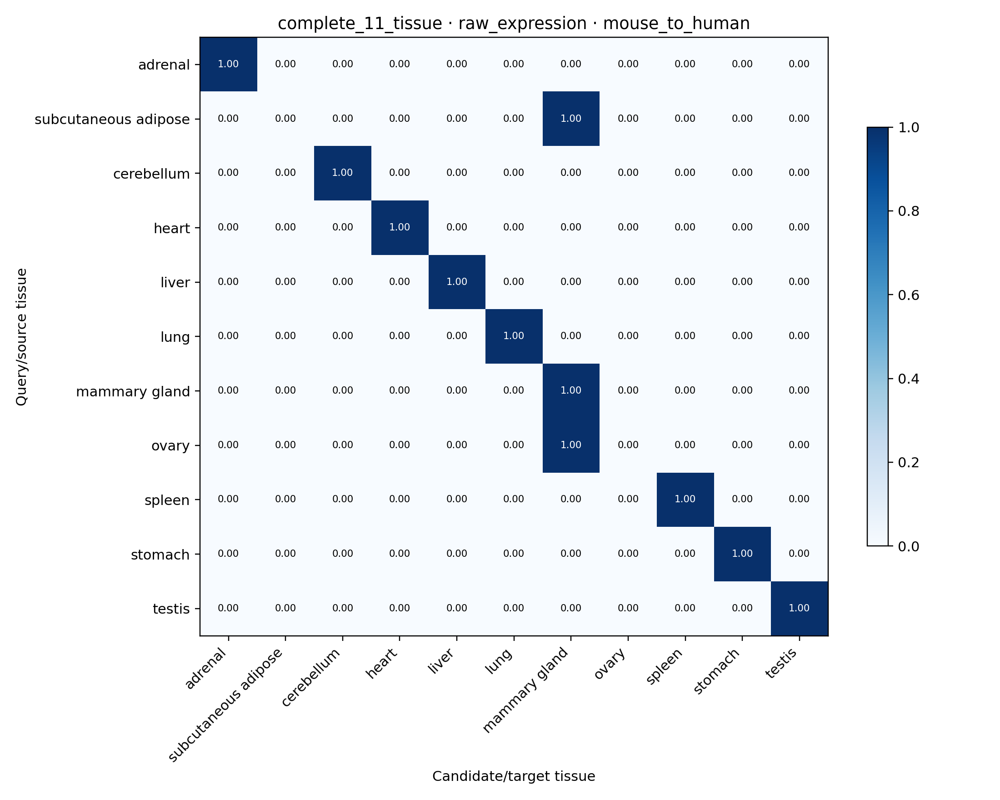

complete_11_tissue · joint_pca · human_to_mouse


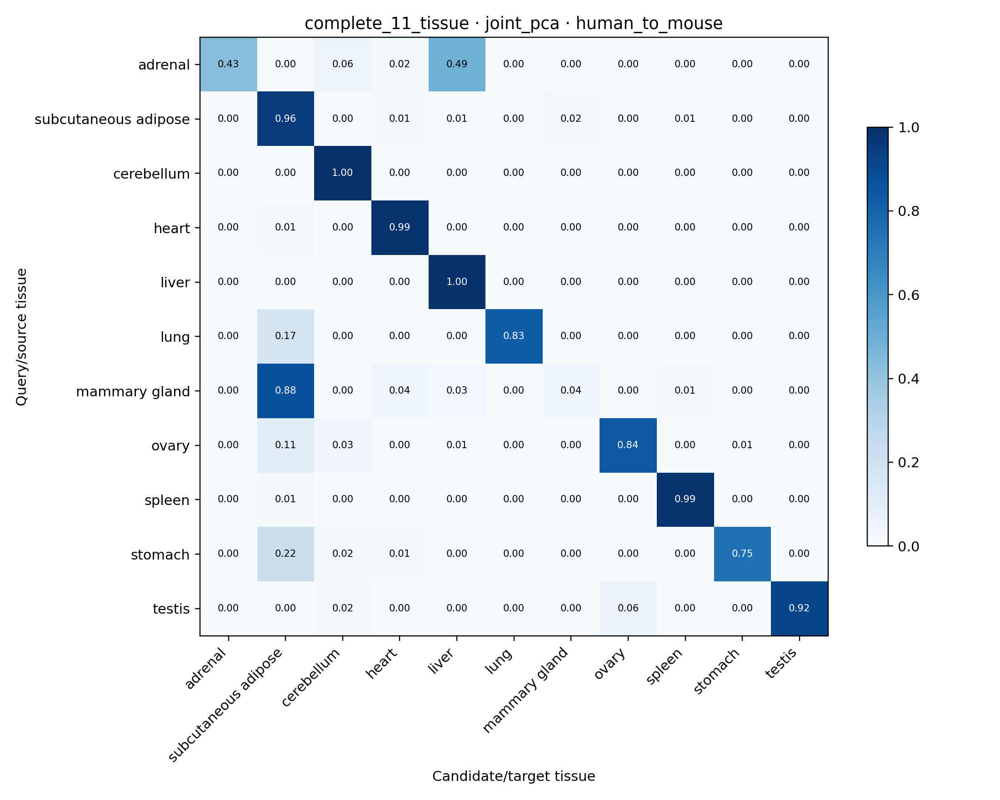

complete_11_tissue · joint_pca · mouse_to_human


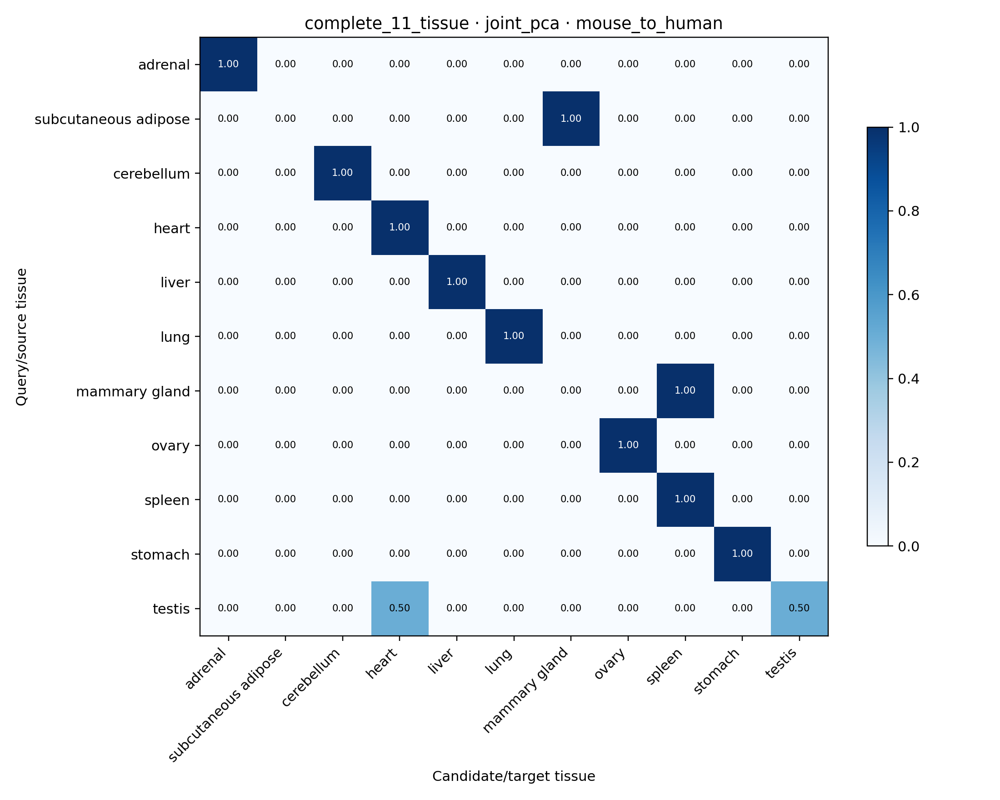

complete_11_tissue · bridgerna · human_to_mouse


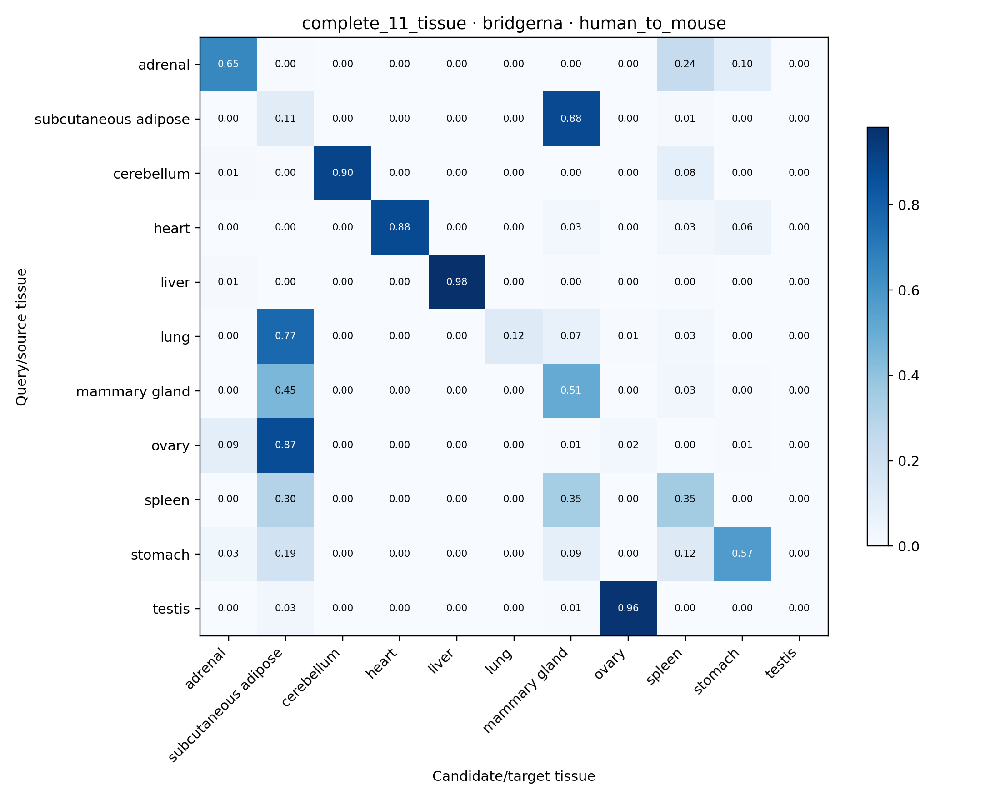

complete_11_tissue · bridgerna · mouse_to_human


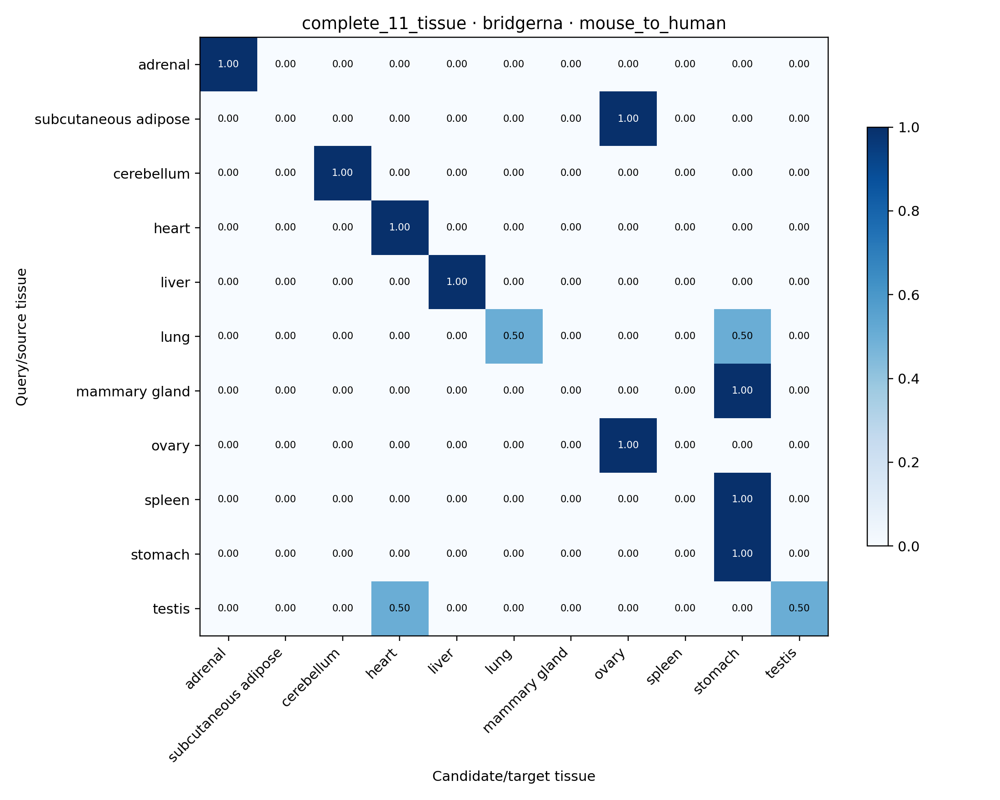

replicated_5_tissue · raw_expression · human_to_mouse


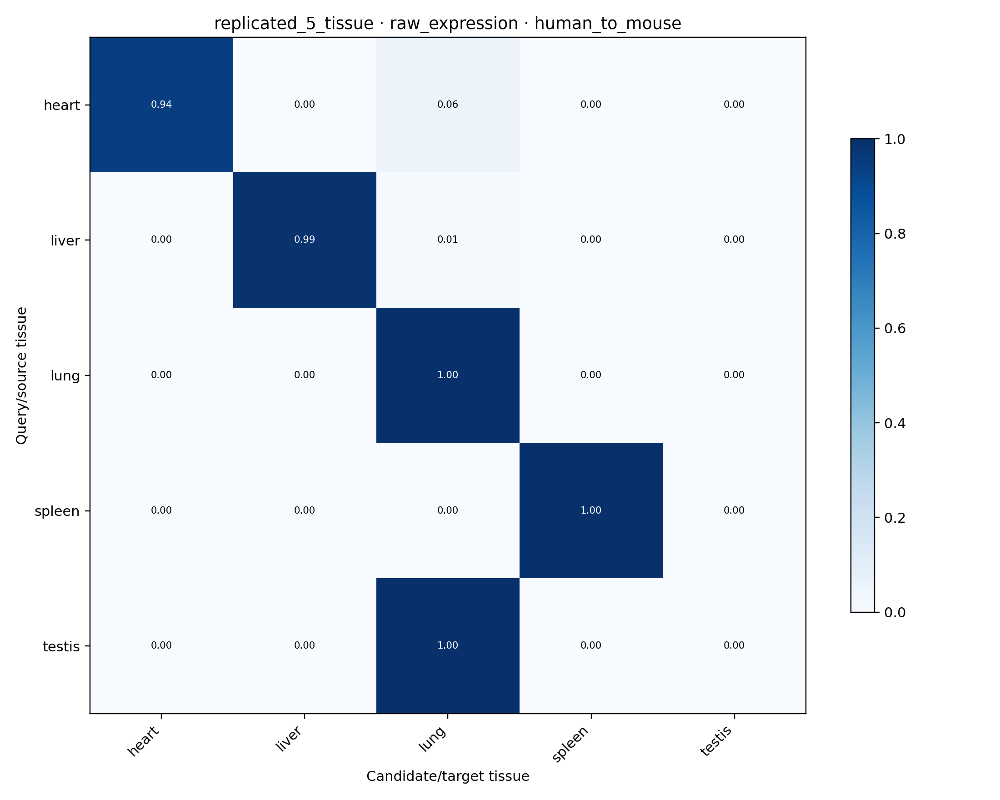

replicated_5_tissue · raw_expression · mouse_to_human


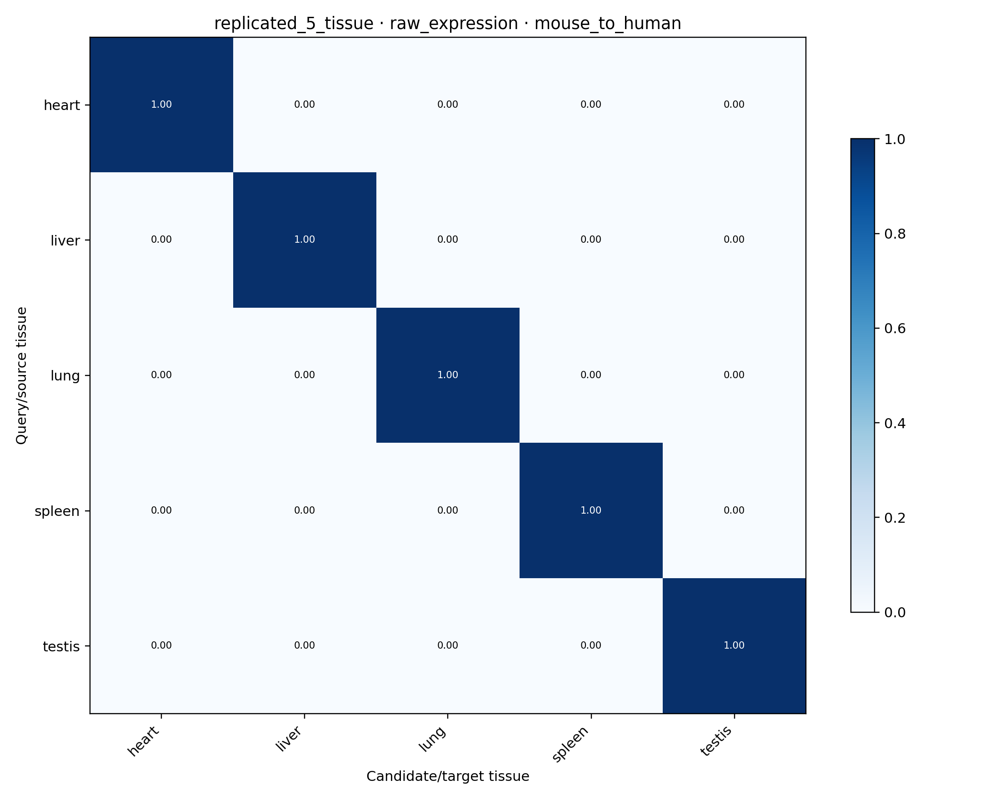

replicated_5_tissue · joint_pca · human_to_mouse


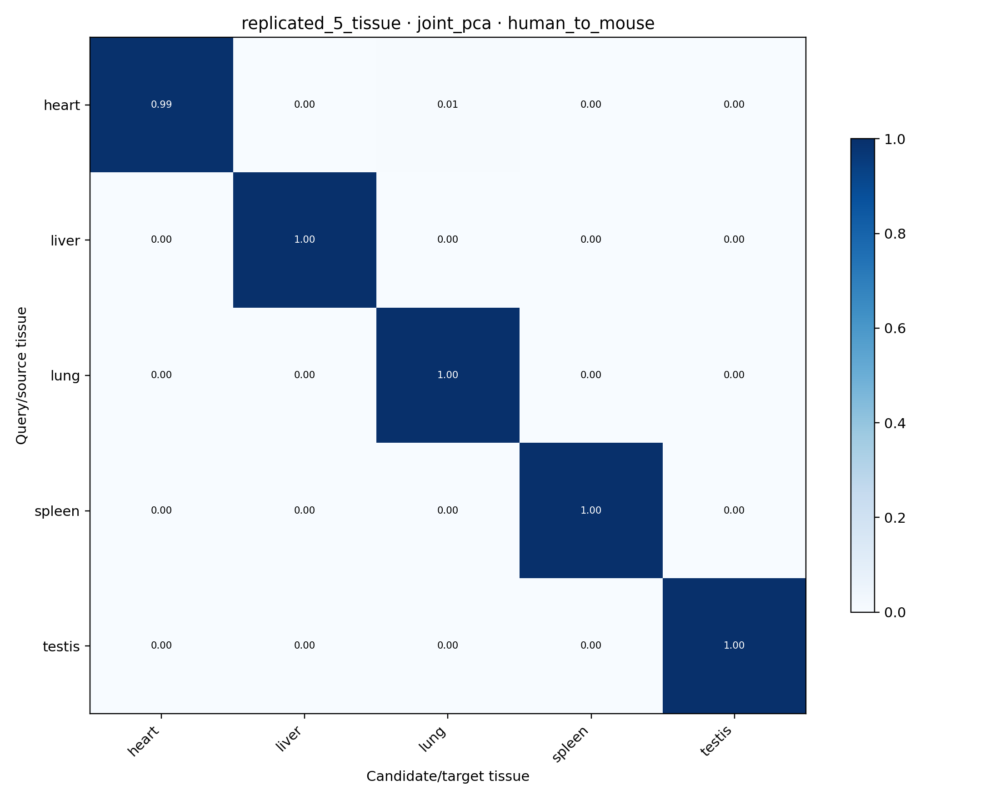

replicated_5_tissue · joint_pca · mouse_to_human


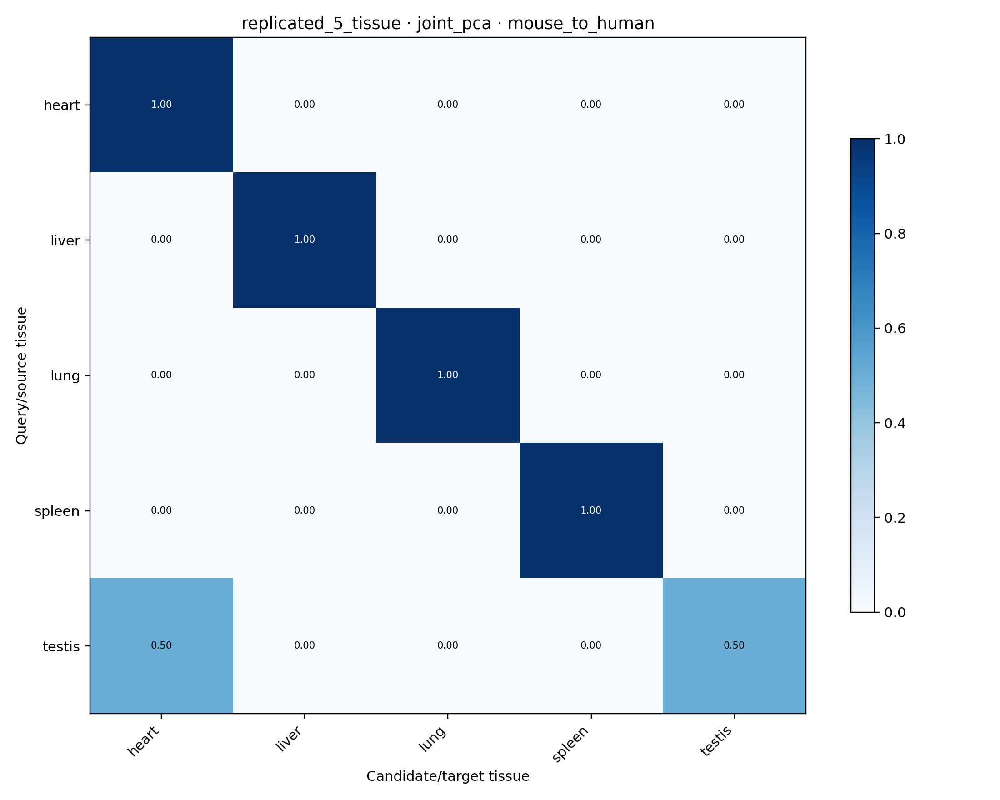

replicated_5_tissue · bridgerna · human_to_mouse


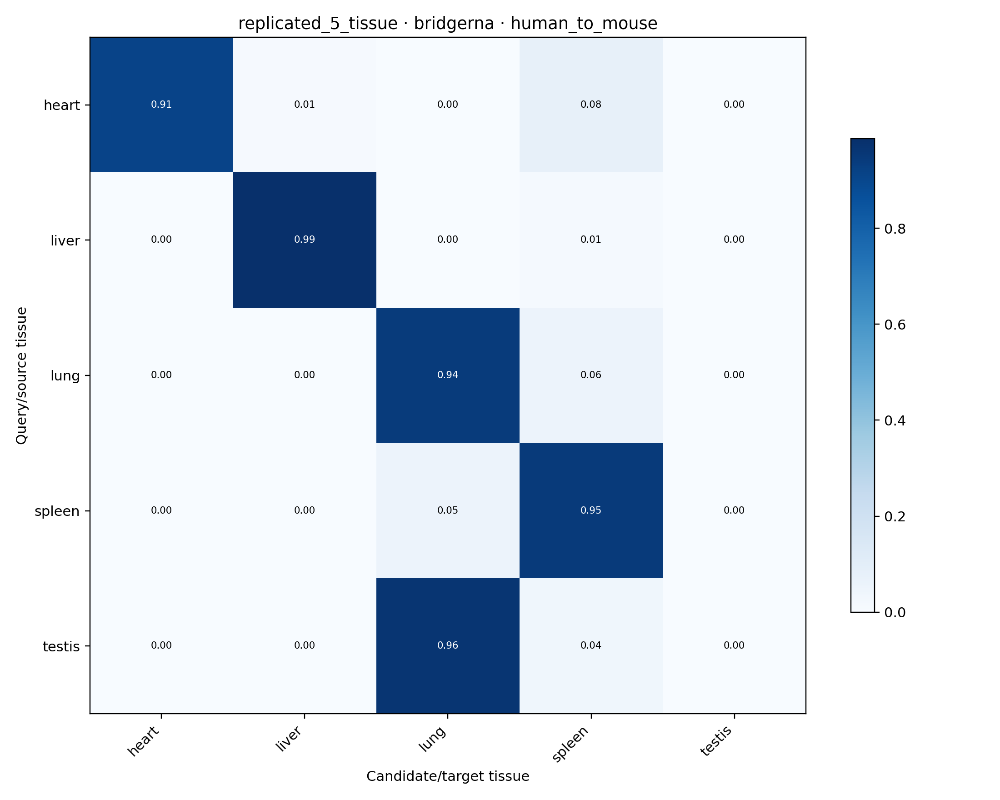

replicated_5_tissue · bridgerna · mouse_to_human


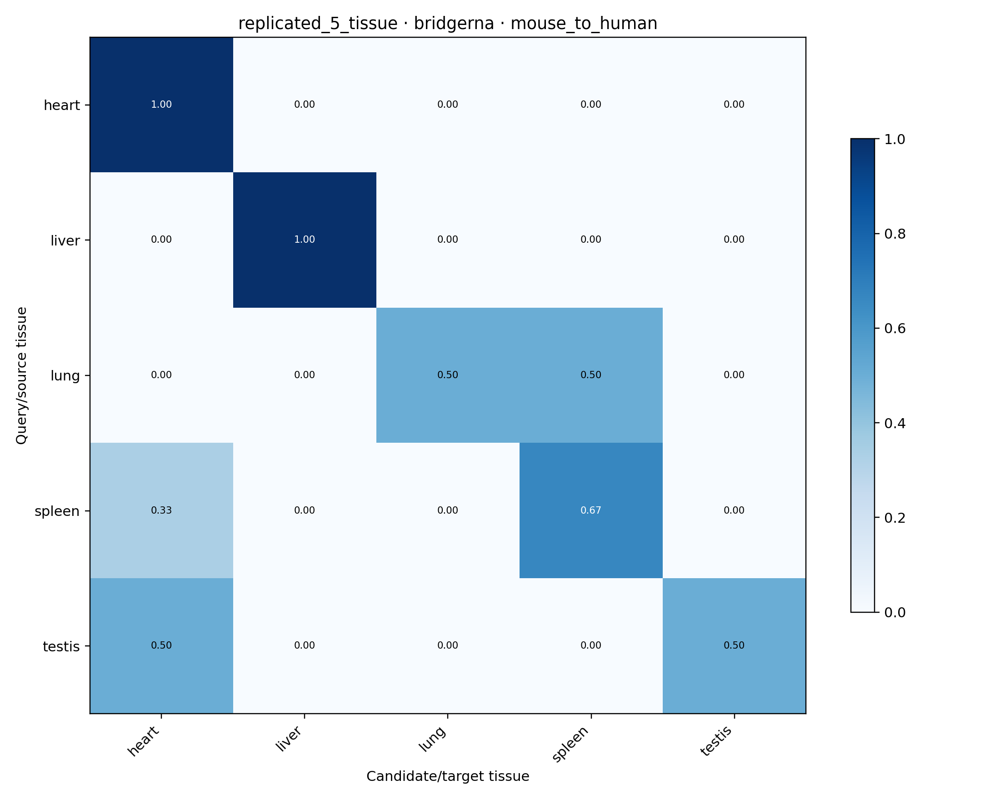

In [6]:
for cohort in ['complete_11_tissue','replicated_5_tissue']:
    for rep in ['raw_expression','joint_pca','bridgerna']:
        for direction in ['human_to_mouse','mouse_to_human']:
            print(cohort, '·', rep, '·', direction)
            display(Image(filename=str(F / f'confusion_{cohort}_{rep}_{direction}.png'), width=700))

## Full cross-species centroid cosine matrices

Rows are human tissue centroids and columns are mouse tissue centroids in the original representation space.

complete_11_tissue · raw_expression


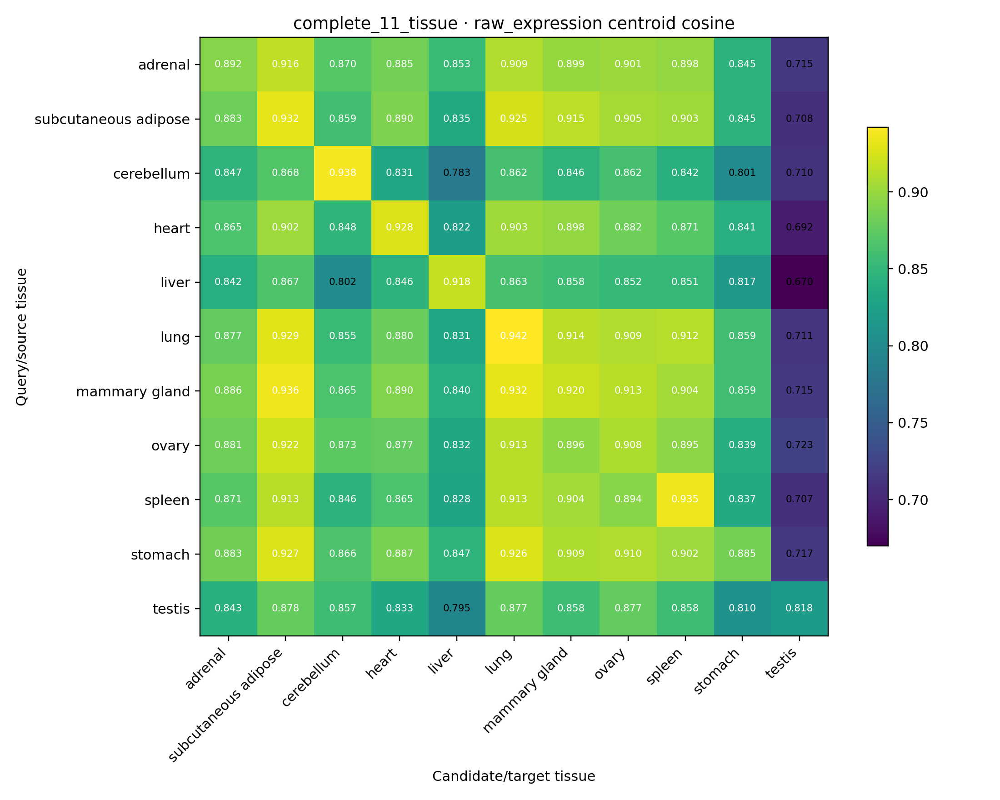

complete_11_tissue · joint_pca


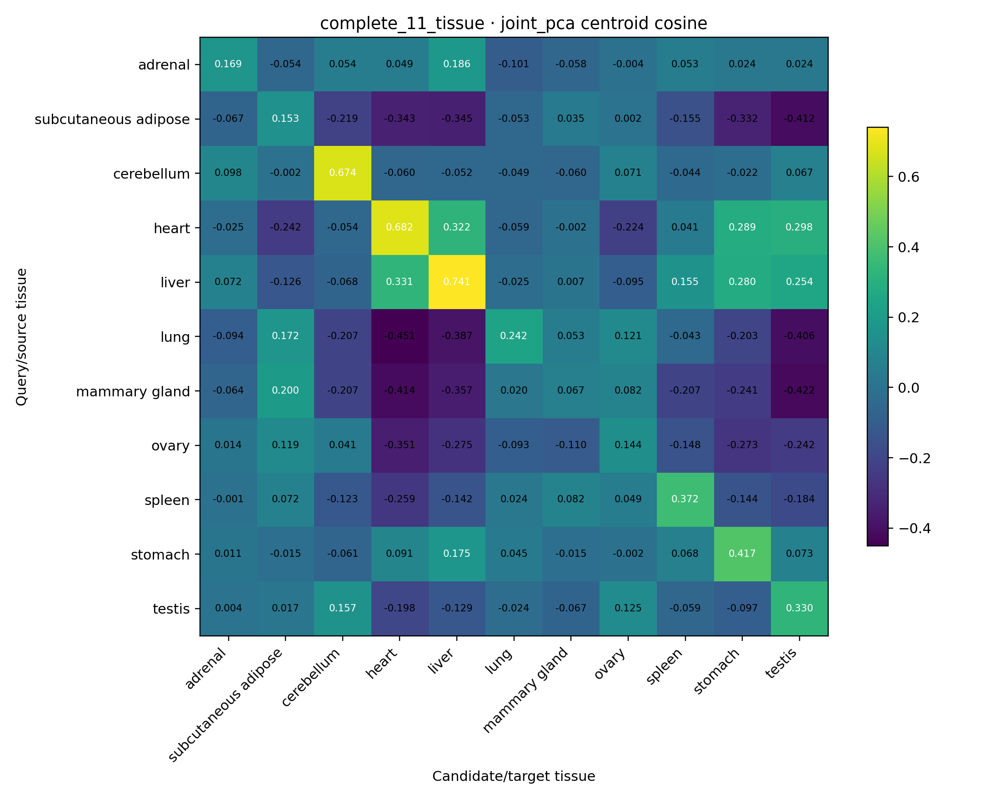

complete_11_tissue · bridgerna


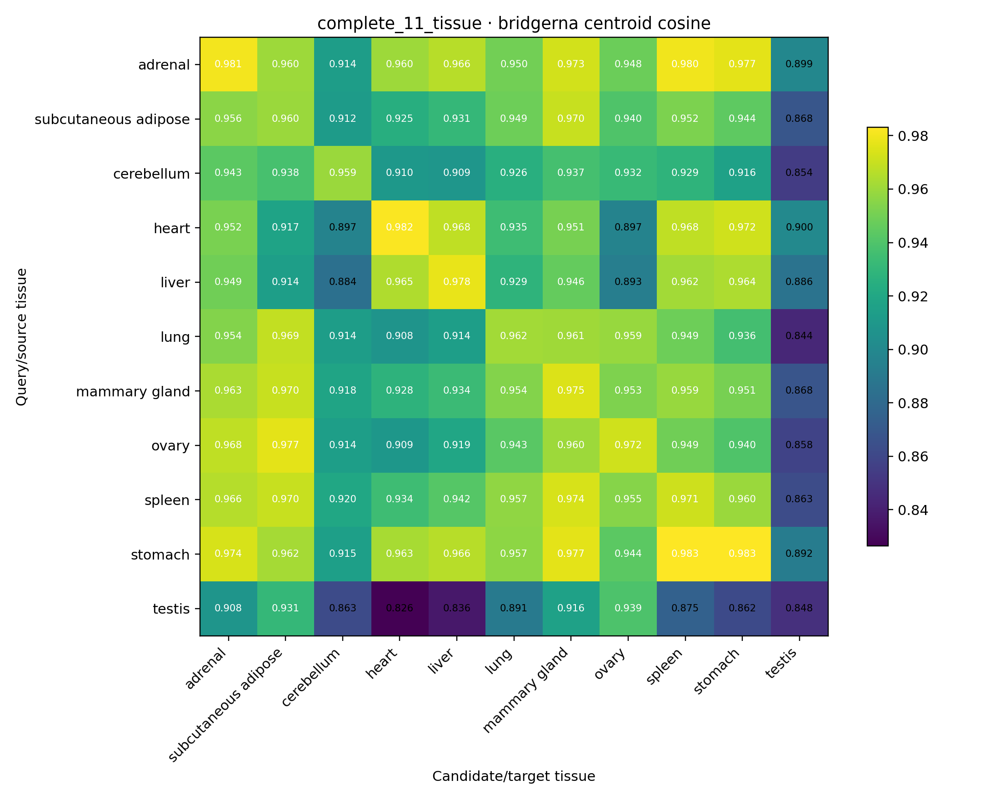

replicated_5_tissue · raw_expression


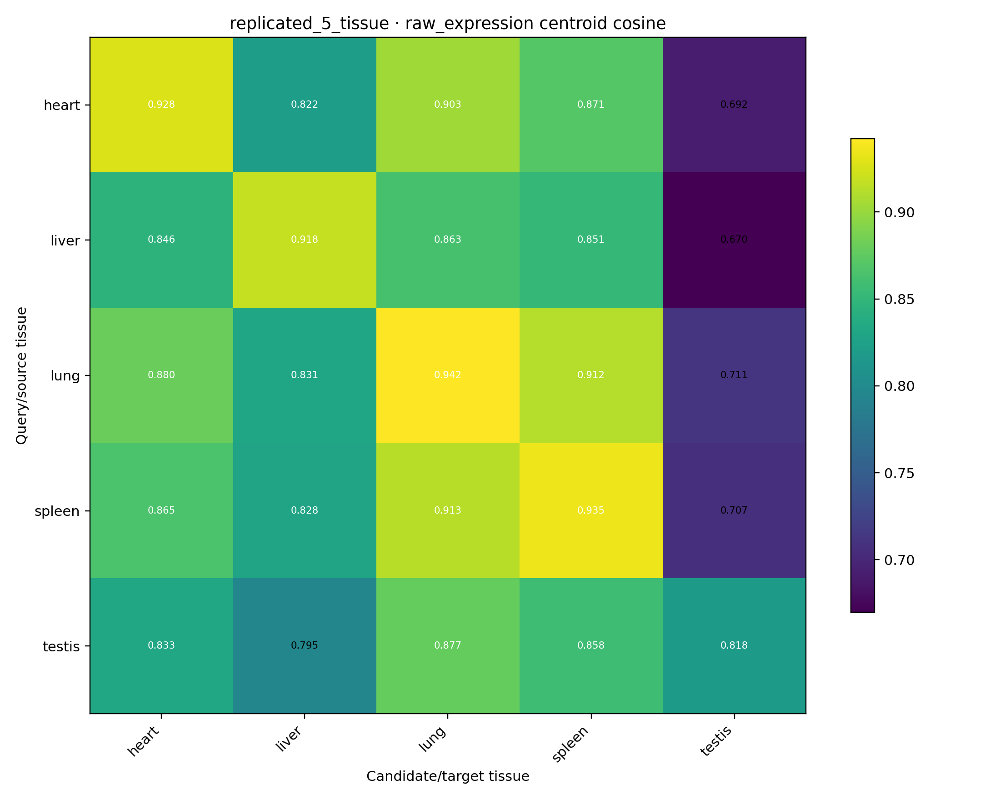

replicated_5_tissue · joint_pca


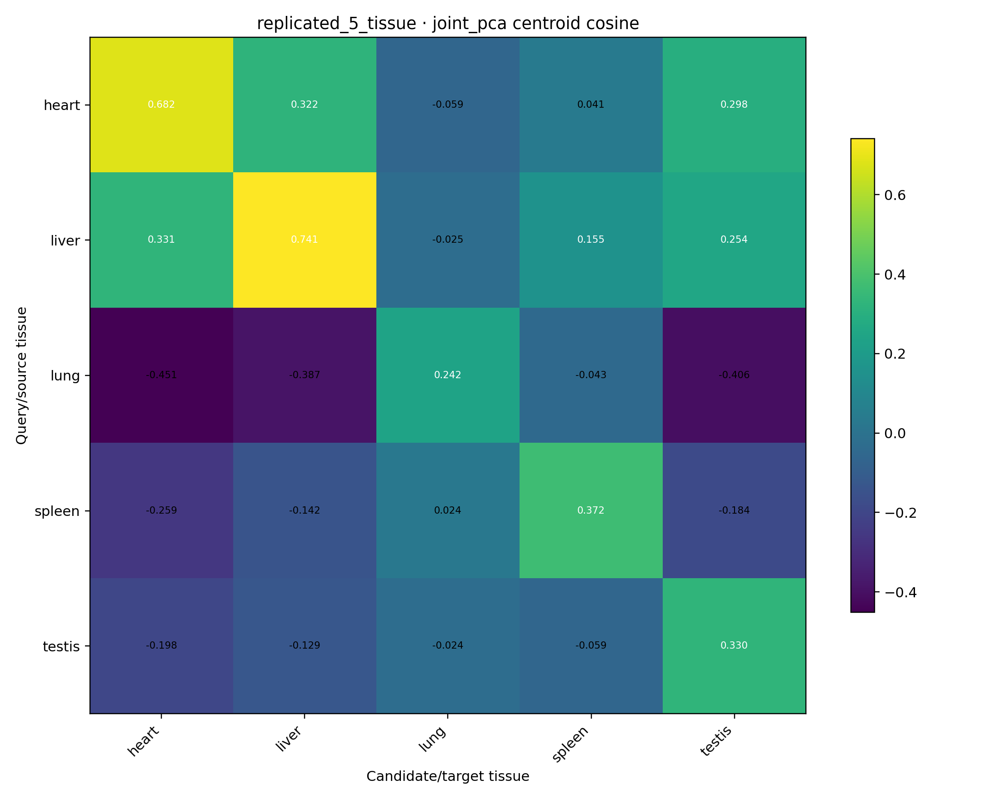

replicated_5_tissue · bridgerna


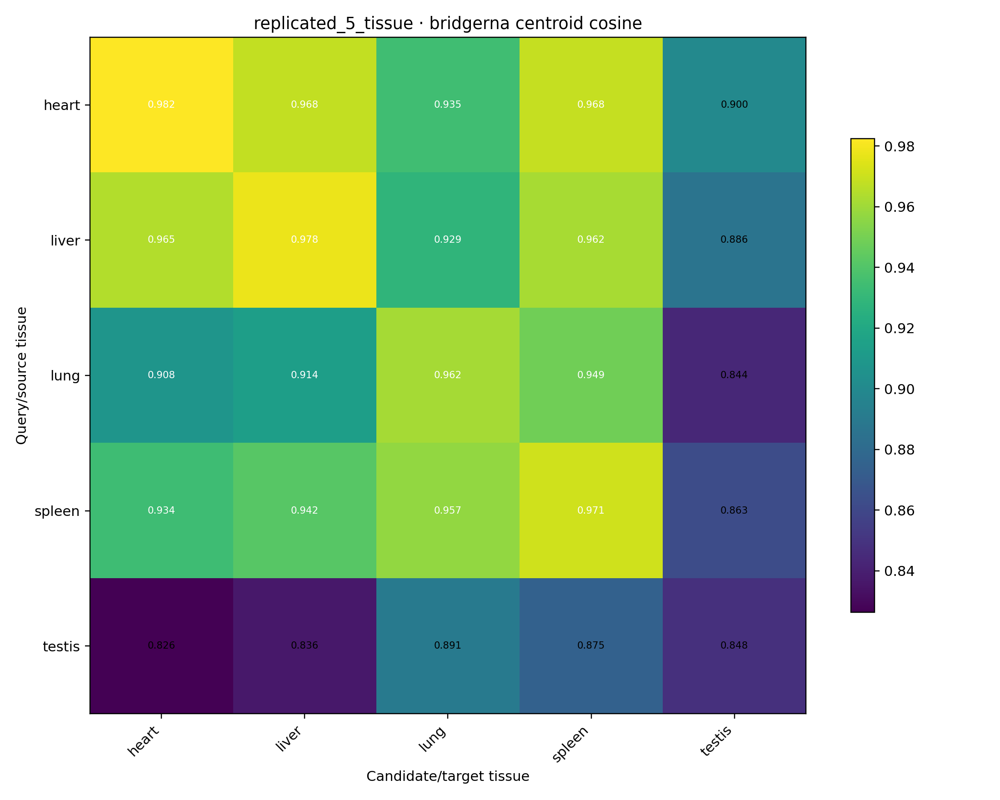

In [7]:
for cohort in ['complete_11_tissue','replicated_5_tissue']:
    for rep in ['raw_expression','joint_pca','bridgerna']:
        print(cohort, '·', rep)
        display(Image(filename=str(F / f'centroid_cosine_{cohort}_{rep}.png'), width=750))

## Joint PCA: PC1–PC20

PCA is fitted jointly to the unaligned human and mouse 15,165-gene log1p(TPM) matrix. For each PC, the table reports variance and two-factor partial η²: species association controls for tissue, and tissue association controls for species. The later-PC panel is selected mechanically as the two highest tissue partial-η² PCs among PC5–PC20, not by retrieval performance.

pc,variance_explained,cumulative_variance,species_partial_eta2,tissue_partial_eta2
1,0.2762,0.2762,0.0114,0.8255
2,0.1804,0.4566,0.0071,0.9638
3,0.0915,0.5481,0.0015,0.9272
4,0.0825,0.6306,0.0015,0.9093
5,0.0552,0.6857,0.0002,0.9384
6,0.0385,0.7242,0.0020,0.8789
7,0.0349,0.7591,0.0040,0.7351
8,0.0299,0.7890,0.0023,0.7142
9,0.0211,0.8101,0.0000,0.3681
10,0.0206,0.8307,0.0038,0.7910


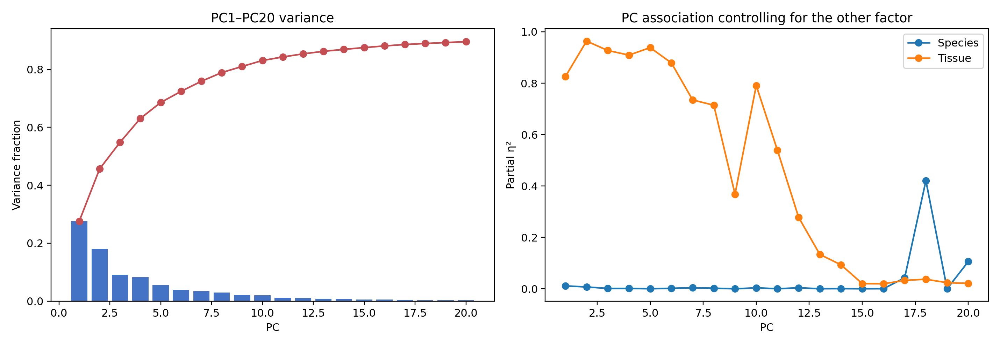

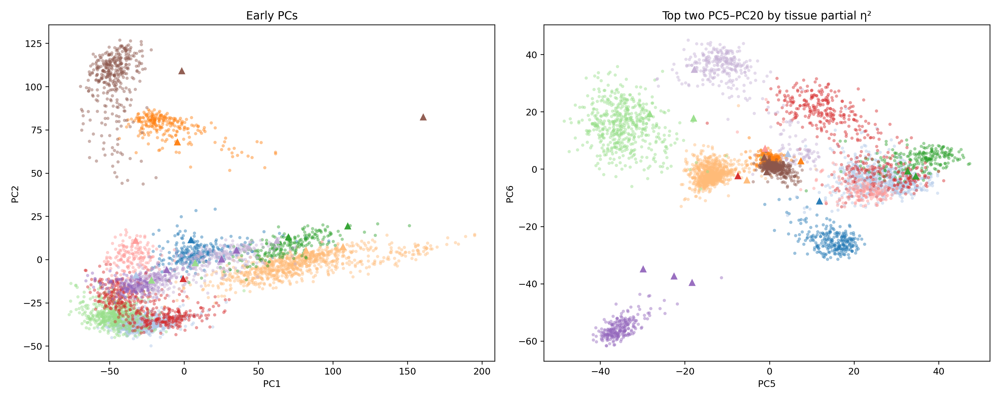

In [8]:
display(pcs.style.format({'variance_explained':'{:.4f}','cumulative_variance':'{:.4f}','species_partial_eta2':'{:.4f}','tissue_partial_eta2':'{:.4f}'}).hide(axis='index'))
display(Image(filename=str(F / 'pca_pc1_20_diagnostics.png'), width=1000))
display(Image(filename=str(F / 'pca_early_and_tissue_structured_pcs.png'), width=1050))

## Descriptive sample/centroid projections

These 2-D projections are descriptive only and are never used for retrieval.

raw_expression


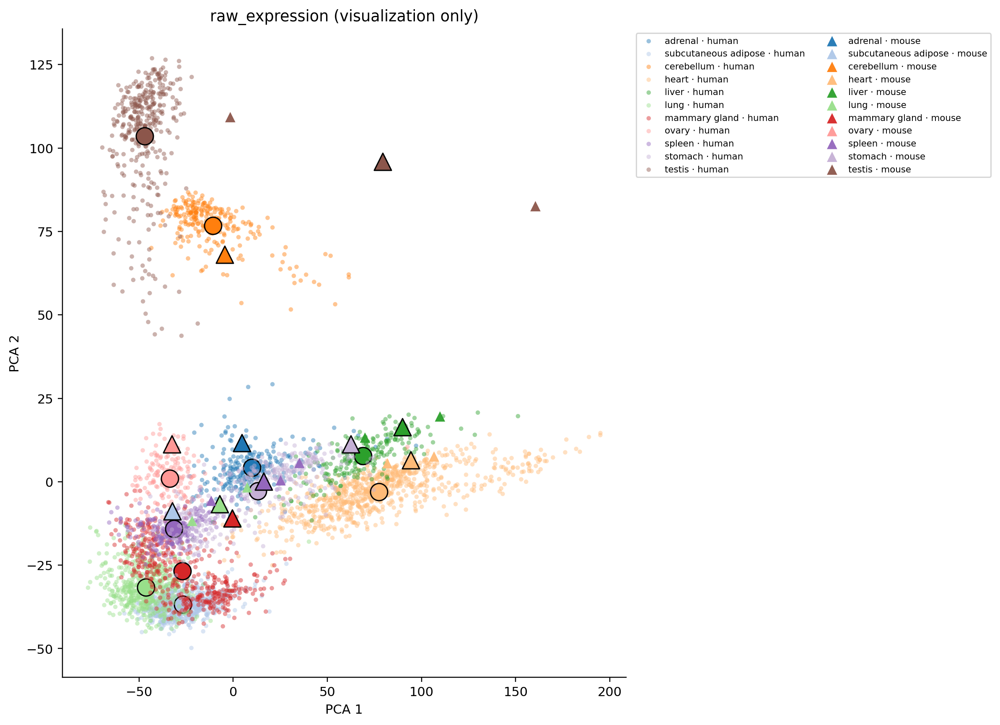

joint_pca


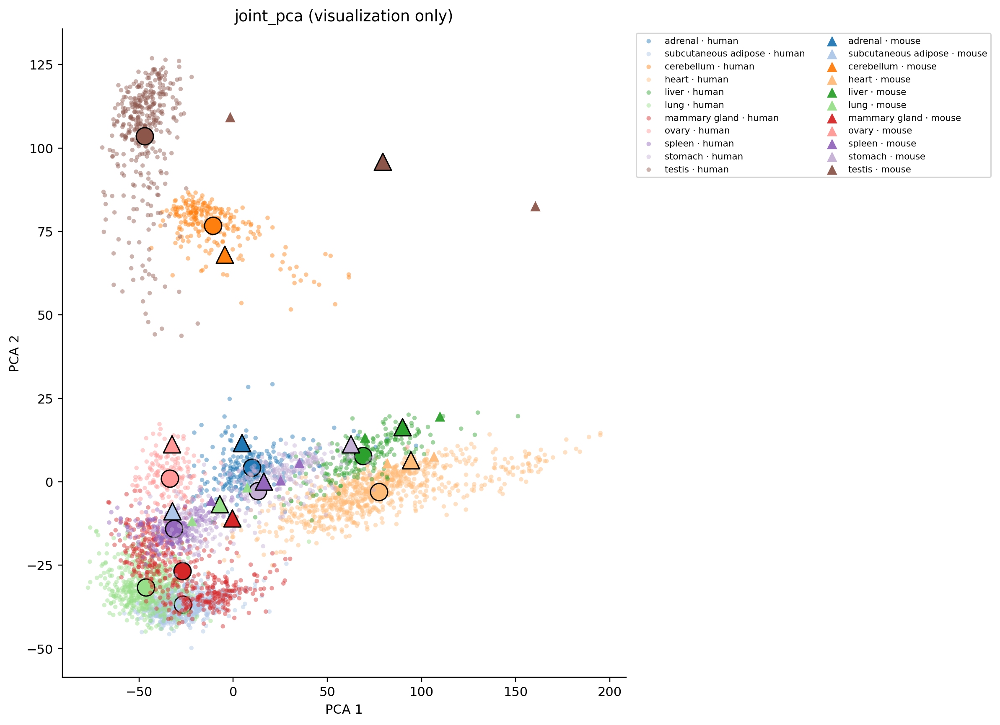

bridgerna


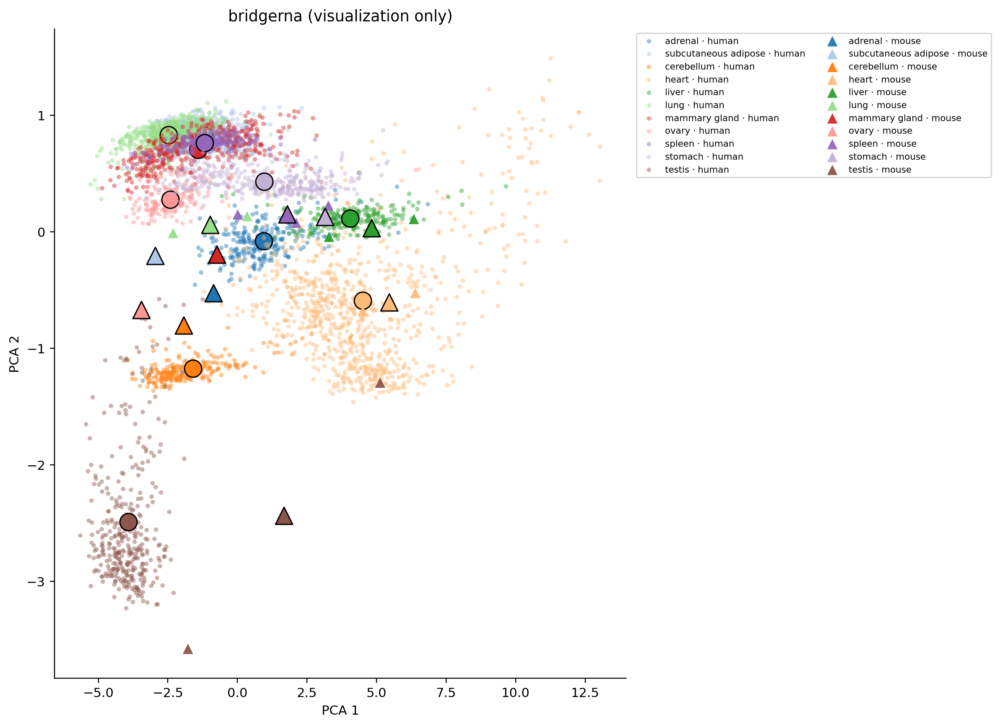

In [9]:
for rep in ['raw_expression','joint_pca','bridgerna']:
    print(rep)
    display(Image(filename=str(F / f'samples_and_centroids_{rep}.png'), width=950))

## Representation-geometry diagnostic

The diagnostic compares original and source-mean-centered centroid cosine, cosine kNN (k=1,3,5), a linear softmax probe, and a one-hidden-layer 64-unit MLP. Centering estimates the mean from the source/training species only and applies it unchanged to both species. Probe settings are fixed a priori and use source-species labels only; target data never select hyperparameters. No feature scaling or cross-species transformation is applied.

In [10]:
geometry_summary = pd.read_csv(R / 'task1a_geometry_summary.csv')
geometry_stats = pd.read_csv(R / 'task1a_geometry_statistics.csv')
geometry_per_tissue = pd.read_csv(R / 'task1a_geometry_per_tissue.csv')
readouts = ['centroid_cosine','centroid_cosine_centered','knn_cosine_k1','knn_cosine_k3','linear_softmax_probe','shallow_mlp_probe']
compact = geometry_summary[geometry_summary.readout.isin(readouts)].copy()
display(compact.style.format({'top1_accuracy':'{:.1%}','macro_f1':'{:.1%}','mrr':'{:.3f}','mean_correct_tissue_margin':'{:.4f}'}, na_rep='—').hide(axis='index'))

cohort,representation,readout,direction,queries,top1_accuracy,macro_f1,mean_correct_tissue_margin,mrr
complete_11_tissue,raw_expression,centroid_cosine,human_to_mouse,4260,61.7%,47.4%,0.0031,0.703
complete_11_tissue,raw_expression,centroid_cosine_centered,human_to_mouse,4260,80.1%,77.6%,0.1453,0.871
complete_11_tissue,raw_expression,knn_cosine_k1,human_to_mouse,4260,66.2%,56.1%,0.3238,—
complete_11_tissue,raw_expression,knn_cosine_k3,human_to_mouse,4260,64.5%,53.9%,0.0550,—
complete_11_tissue,raw_expression,linear_softmax_probe,human_to_mouse,17,88.2%,78.8%,21.8152,—
complete_11_tissue,raw_expression,shallow_mlp_probe,human_to_mouse,17,82.4%,69.7%,2.6898,—
complete_11_tissue,raw_expression,centroid_cosine,mouse_to_human,17,88.2%,77.3%,0.0323,0.926
complete_11_tissue,raw_expression,centroid_cosine_centered,mouse_to_human,17,76.5%,61.8%,0.2035,0.863
complete_11_tissue,raw_expression,knn_cosine_k1,mouse_to_human,17,88.2%,77.3%,0.7654,—
complete_11_tissue,raw_expression,knn_cosine_k3,mouse_to_human,17,88.2%,77.3%,2.2948,—


### Cosine geometry

BridgeRNA's complete-cohort cross-species cosine has mean 0.924 and SD 0.049. Source-only centering expands the SD to 0.487–0.510 and the 1st–99th percentile range from about 0.209 to 1.66–1.68. Thus, a dominant common direction is present.

cohort,representation,space,geometry_measure,group,n,mean,sd,minimum,maximum,p01,p99
complete_11_tissue,bridgerna,original,cosine,same_tissue_cross_species,6676,0.9514,0.0546,0.6507,0.9898,0.7150,0.9875
complete_11_tissue,bridgerna,original,cosine,different_tissue_cross_species,65744,0.9212,0.0474,0.6720,0.9869,0.7833,0.9796
complete_11_tissue,bridgerna,original,cosine,all_cross_species,72420,0.9240,0.0489,0.6507,0.9898,0.7737,0.9823
complete_11_tissue,bridgerna,original,cosine,sampled_all_pairs,19997,0.9479,0.0417,0.6712,0.9998,0.8154,0.9988
complete_11_tissue,bridgerna,centered_human_to_mouse,cosine,all_cross_species,72420,-0.0258,0.4866,-0.8905,0.9115,-0.8286,0.8487
complete_11_tissue,bridgerna,centered_mouse_to_human,cosine,all_cross_species,72420,0.0311,0.5099,-0.9117,0.9422,-0.7841,0.8723


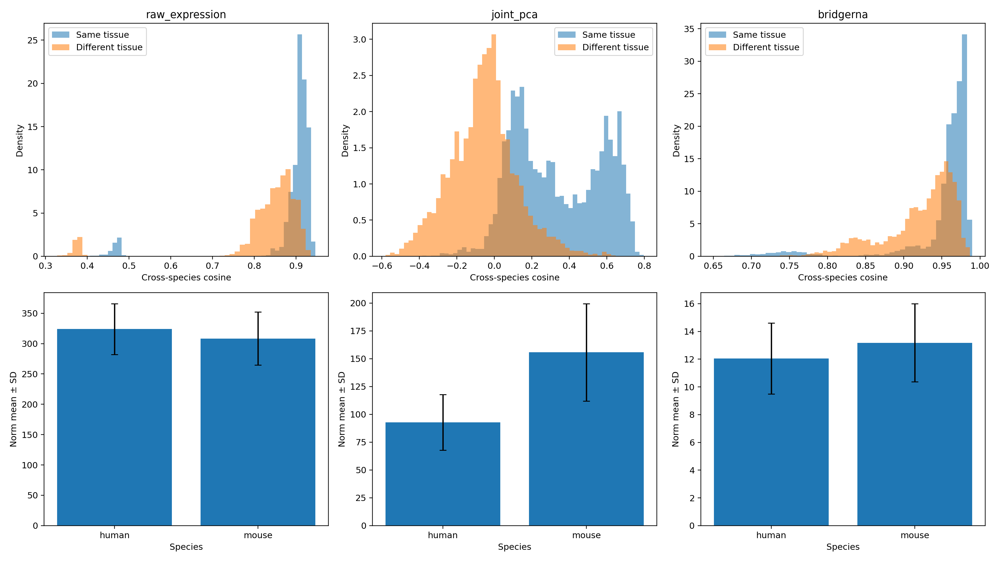

In [11]:
bridge_geometry = geometry_stats[(geometry_stats.cohort == 'complete_11_tissue') & (geometry_stats.representation == 'bridgerna') & (geometry_stats.geometry_measure == 'cosine')]
display(bridge_geometry.style.format({'mean':'{:.4f}','sd':'{:.4f}','minimum':'{:.4f}','maximum':'{:.4f}','p01':'{:.4f}','p99':'{:.4f}'}).hide(axis='index'))
display(Image(filename=str(R / 'figures/task1a_geometry/cosine_and_norm_distributions.png'), width=1050))

### BridgeRNA confusion matrices under alternative readouts

complete_11_tissue · centroid_cosine


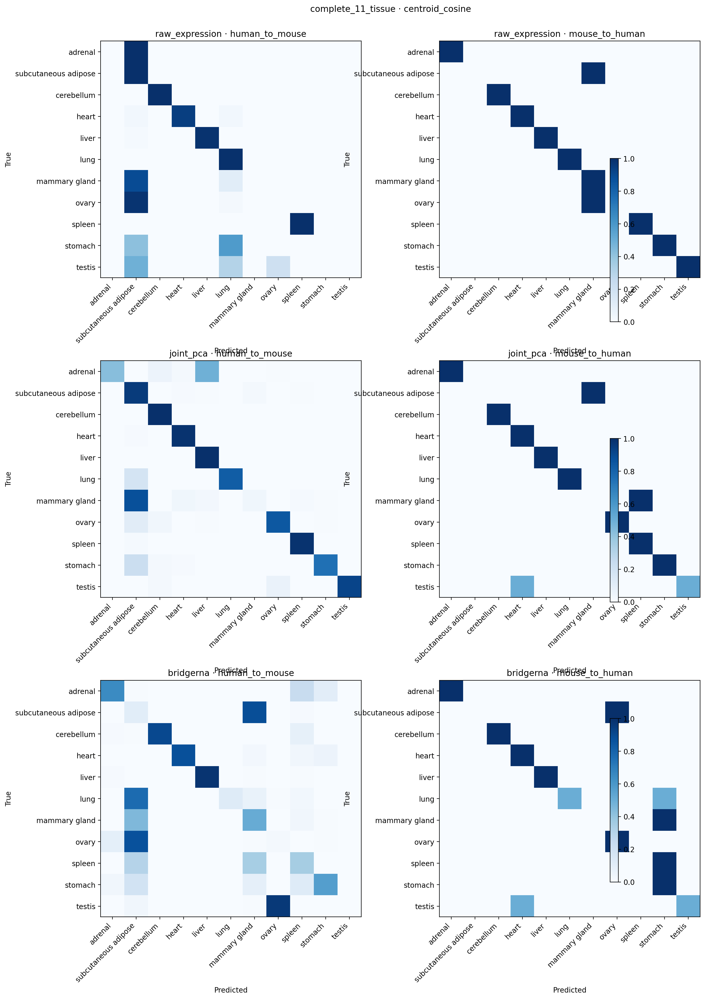

complete_11_tissue · centroid_cosine_centered


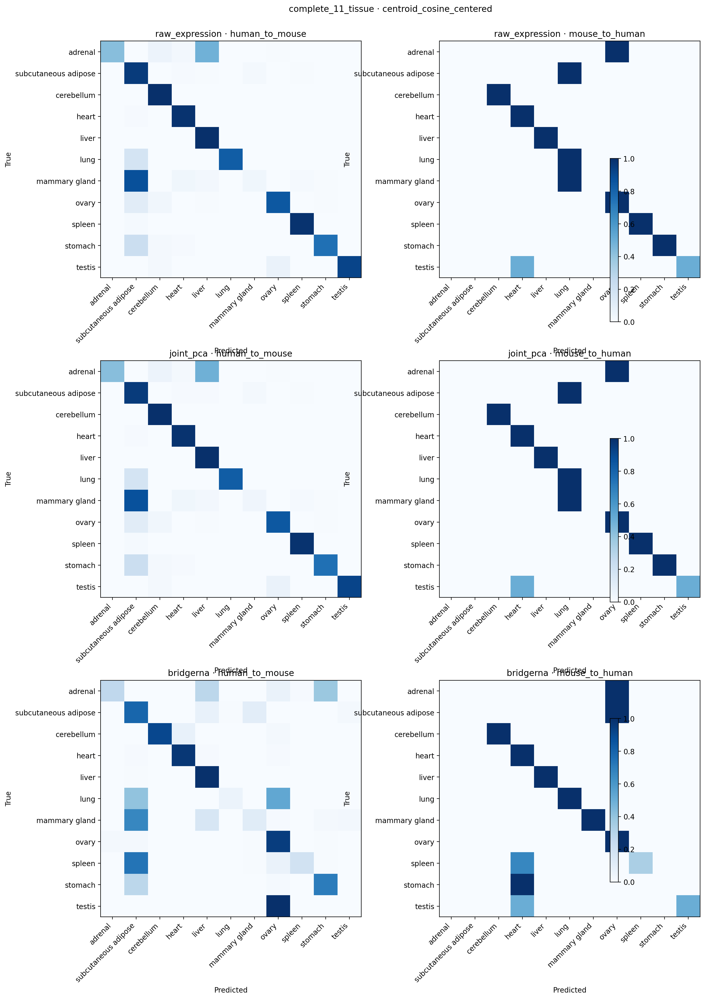

complete_11_tissue · knn_cosine_k1


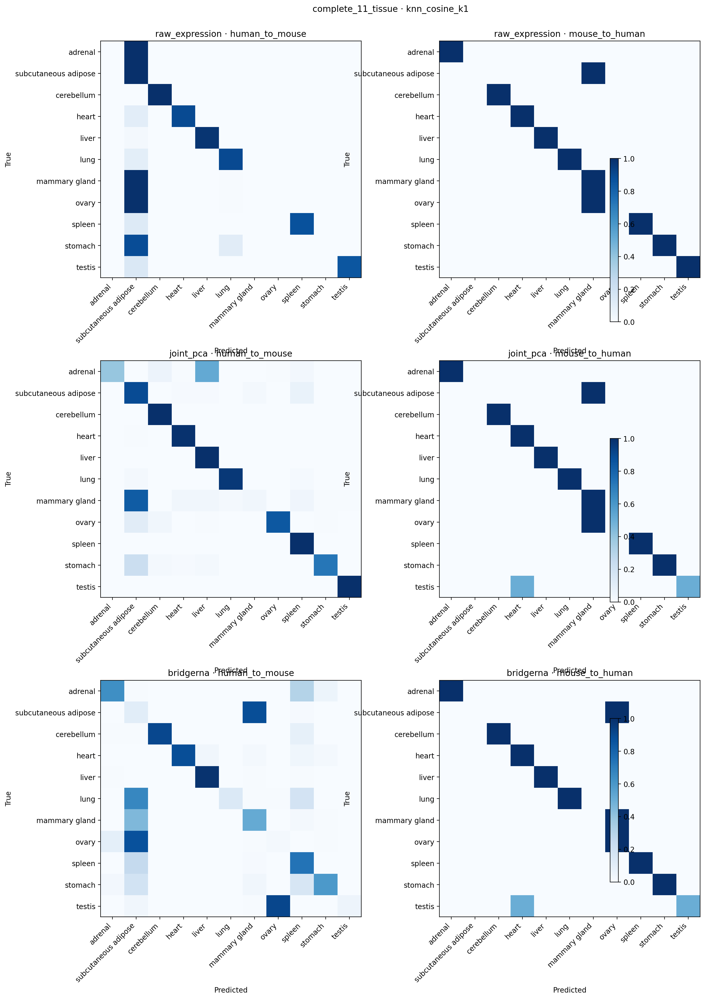

complete_11_tissue · linear_softmax_probe


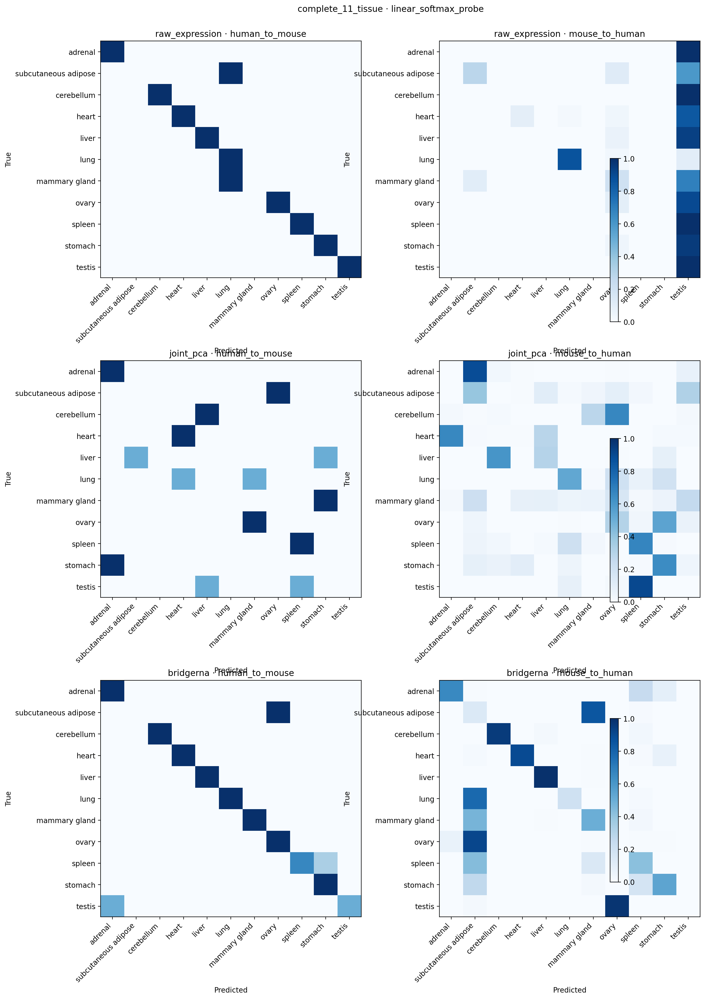

complete_11_tissue · shallow_mlp_probe


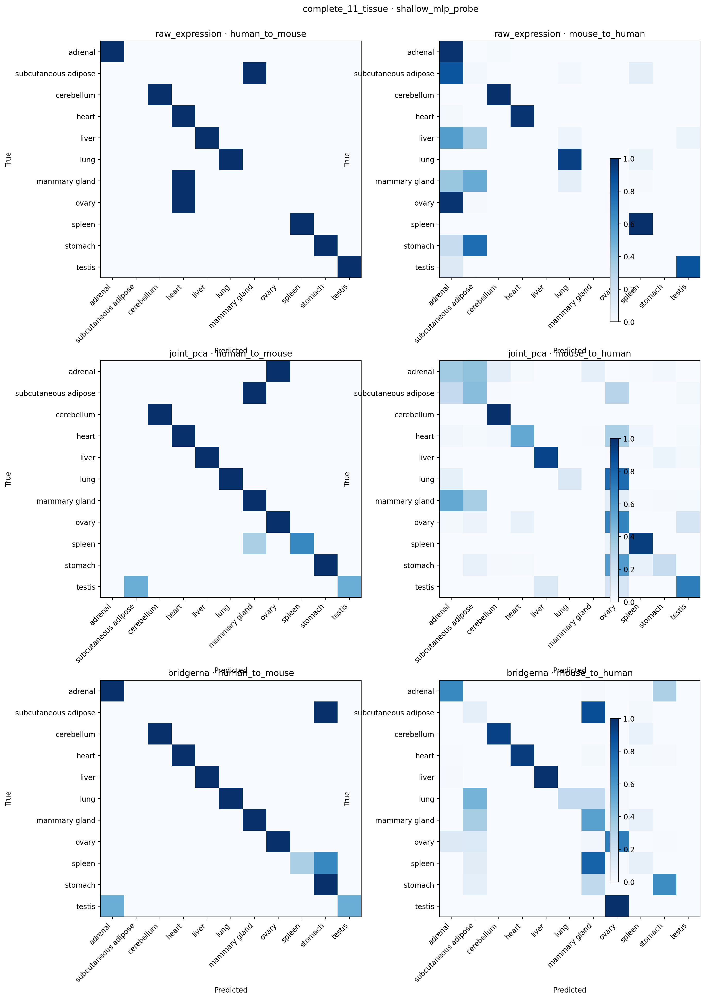

replicated_5_tissue · centroid_cosine


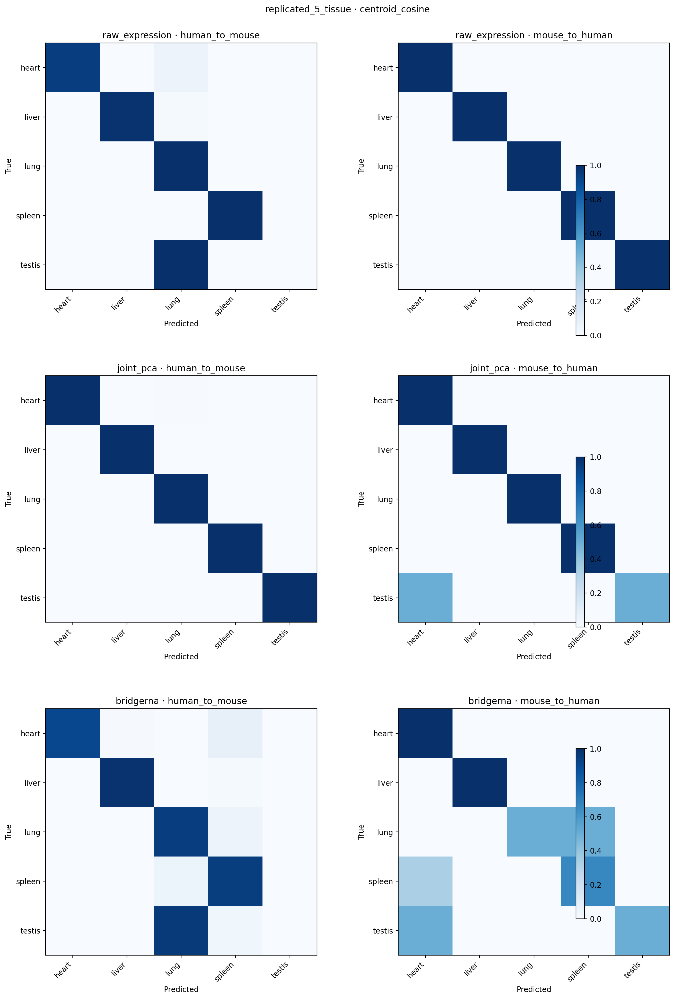

replicated_5_tissue · centroid_cosine_centered


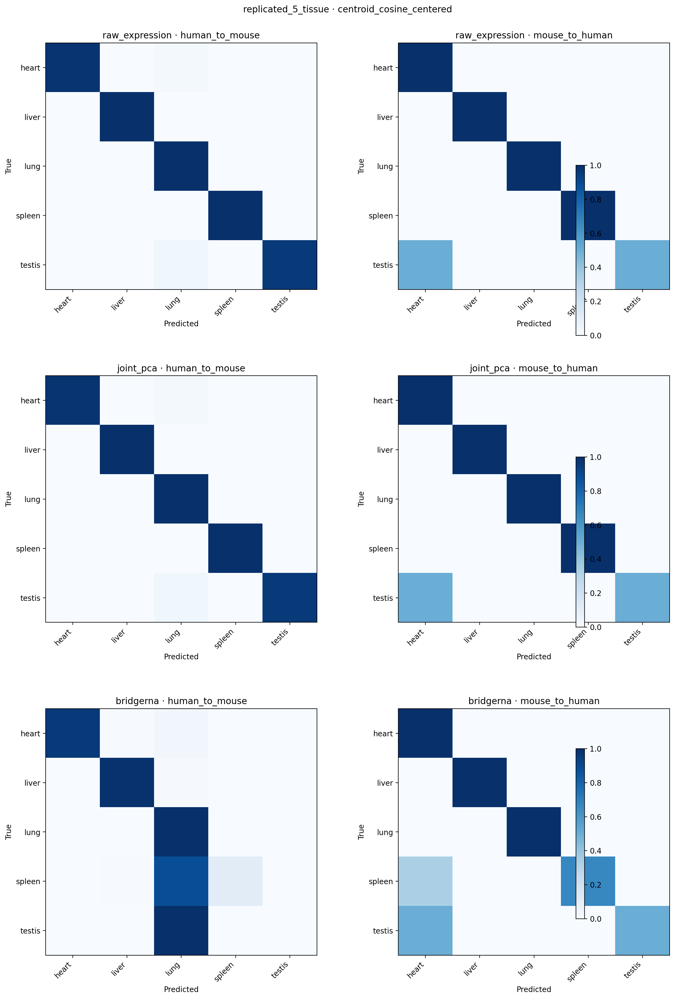

replicated_5_tissue · knn_cosine_k1


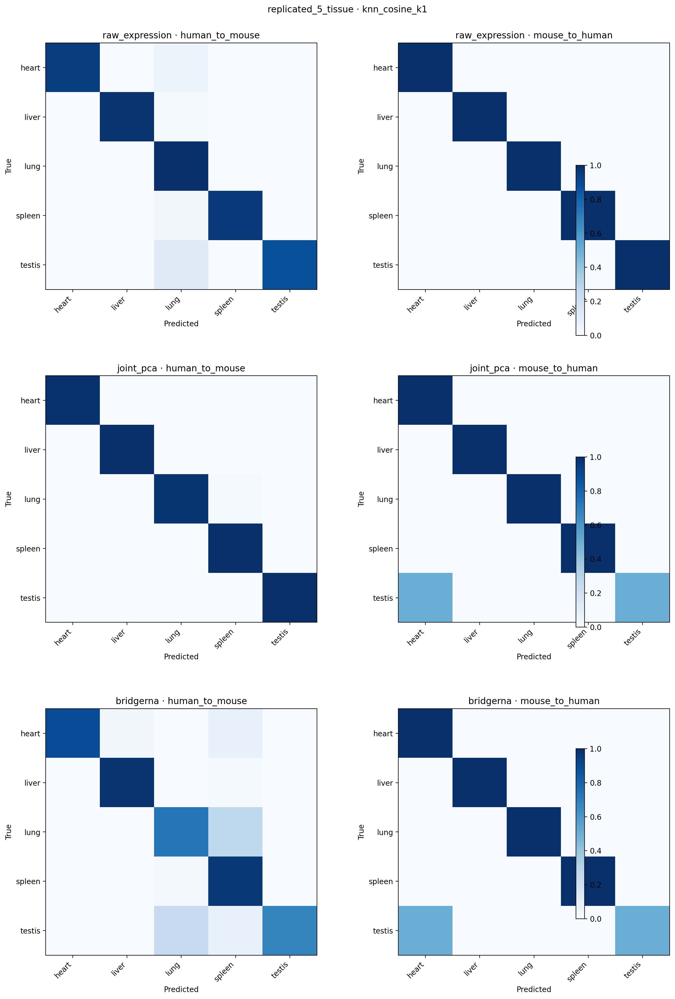

replicated_5_tissue · linear_softmax_probe


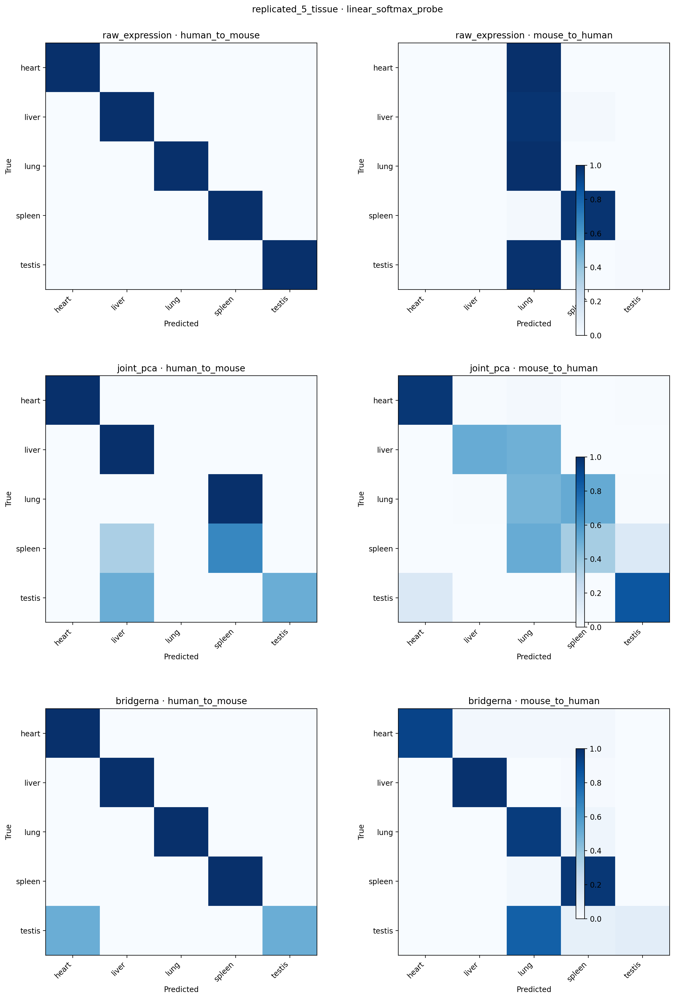

replicated_5_tissue · shallow_mlp_probe


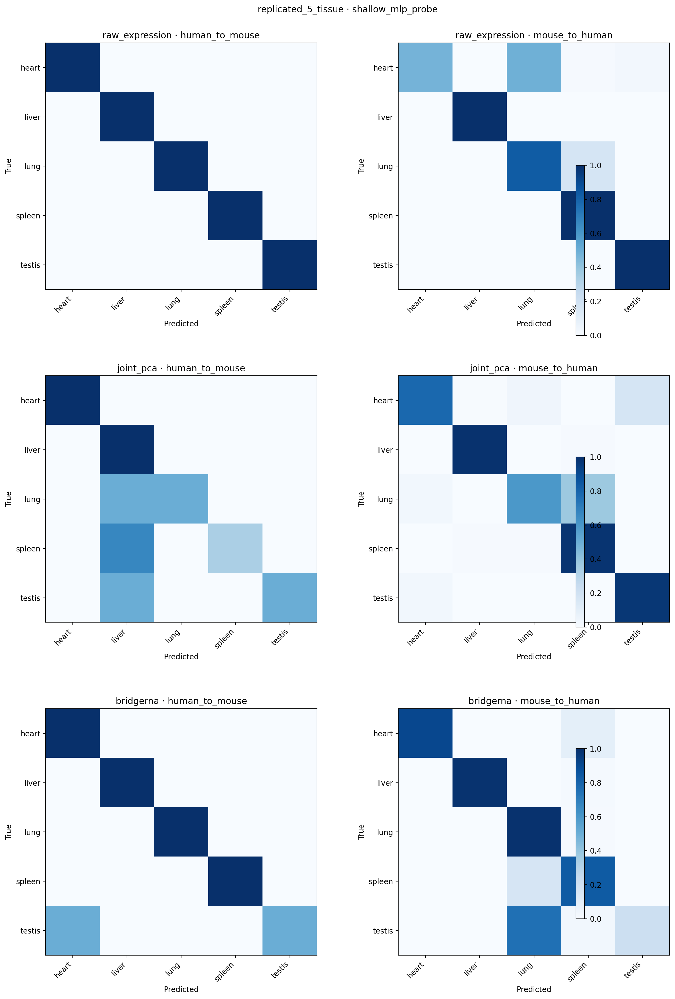

In [12]:
for cohort in ['complete_11_tissue','replicated_5_tissue']:
    for readout in ['centroid_cosine','centroid_cosine_centered','knn_cosine_k1','linear_softmax_probe','shallow_mlp_probe']:
        print(cohort, '·', readout)
        display(Image(filename=str(R / f'figures/task1a_geometry/confusions_{cohort}_{readout}.png'), width=900))

### Does BridgeRNA lack cross-species tissue information?

**No—the evidence favors tissue information being present but poorly exposed by raw cosine-to-centroid geometry.** On 11 tissues, BridgeRNA centroid Top-1 is 46.0% H→M and 58.8% M→H. Centering raises these to 54.9% and 64.7%, while k=1 individual-neighbor retrieval reaches 49.2% and 82.4%. More decisively, a human-trained linear probe identifies 82.4% of mouse profiles, despite the raw centroid result of 46.0%. The reverse linear transfer is weaker (48.2%), plausibly constrained by training on only 17 mouse profiles.

The five-tissue replicated subset strengthens this conclusion: BridgeRNA kNN reaches 86.3% H→M at k=3 and 90.9% M→H at k=1; the linear probe reaches 90.9% and 80.7%. The shallow MLP does not materially outperform the linear probe, so there is little evidence that tissue information requires a strongly nonlinear readout. Centering confirms a dominant common embedding direction, but its mixed retrieval effects show that this direction is not the only geometry issue.

## Publication comparison figures

These figures compare the prespecified cross-species tissue-prediction readouts using values loaded from the completed Task 1A result table. The single kNN comparison uses **k = 1 consistently** across cohorts and directions rather than selecting k from target performance.

### 11-tissue fully unseen benchmark

![Task 1A 11-tissue method comparison](results/figures/task1a_geometry/task1a_methods_11_tissue.png)

### 5-tissue replicated benchmark

![Task 1A 5-tissue method comparison](results/figures/task1a_geometry/task1a_methods_5_tissue.png)

### BridgeRNA readout improvement relative to centroid cosine

![BridgeRNA readout improvement](results/figures/task1a_geometry/task1a_bridgerna_readout_improvement.png)

Vector PDF versions are saved beside the PNG files under `results/figures/task1a_geometry/`. The figures can be regenerated with `pipeline/plot_task1a_cross_species_methods.py`.

## Balanced representation comparison

This separate extension includes all healthy, adult, unperturbed, expression-ready ENCODE experiments with defensible GTEx matches, while retaining each experiment's pretraining-exposure class. The primary expanded cohort requires at least two mouse experiments per tissue. GTEx is sampled without replacement to match the mouse count within every tissue, repeated for 20 deterministic seeds. Raw expression, joint PCA, and frozen BridgeRNA are each evaluated with the same centroid-cosine, 1-NN, and source-only linear-probe readouts.

Representations are cached once; only GTEx indices vary across seeds. The original fully-unseen benchmark above remains the strict generalization analysis.

In [13]:
BAL = R / 'task1a_balanced_geometry'
balanced_summary = pd.read_csv(BAL / 'summary_results.csv')
balanced_tissues = pd.read_csv(BAL / 'cohort_tissue_counts.csv')
exposure_summary = pd.read_csv(BAL / 'mouse_pretraining_exposure_summary.csv')

print('Expanded replicated cohort')
display(balanced_tissues.query("cohort == 'expanded_replicated'").style.hide(axis='index'))
print('Mouse pretraining exposure')
display(exposure_summary.style.hide(axis='index'))

balanced_publication = balanced_summary.query("balance == 'balanced'").copy()
for column in ['accuracy_mean','accuracy_sd','macro_f1_mean','macro_f1_sd']:
    balanced_publication[column] = balanced_publication[column].map(lambda x: f'{x:.1%}')
for column in ['mrr_mean','mrr_sd']:
    balanced_publication[column] = balanced_publication[column].map(lambda x: '—' if pd.isna(x) else f'{x:.3f}')
display(balanced_publication.style.hide(axis='index'))

Expanded replicated cohort


cohort,tissue,mouse_experiments,gtex_profiles_available
expanded_replicated,adrenal,8,250
expanded_replicated,cerebellum,2,236
expanded_replicated,cortex,7,243
expanded_replicated,heart,9,823
expanded_replicated,hippocampus,7,181
expanded_replicated,liver,4,222
expanded_replicated,lung,3,532
expanded_replicated,ovary,2,173
expanded_replicated,skeletal muscle,6,756
expanded_replicated,spleen,3,239


Mouse pretraining exposure


tissue,pretraining_exposure,size
adrenal,fully_unseen,1
adrenal,same_study_seen,7
cerebellum,exact_sample_seen,1
cerebellum,fully_unseen,1
cortex,same_study_seen,7
frontal cortex,exact_sample_seen,1
heart,fully_unseen,2
heart,same_study_seen,7
hippocampus,same_study_seen,7
liver,fully_unseen,2


cohort,balance,representation,readout,direction,accuracy_mean,accuracy_sd,macro_f1_mean,macro_f1_sd,mrr_mean,mrr_sd,seeds,train_samples,test_samples
expanded_replicated,balanced,bridgerna,centroid_cosine,human_to_mouse,64.3%,5.5%,62.5%,4.3%,0.759,0.033,20,54,54
expanded_replicated,balanced,bridgerna,centroid_cosine,mouse_to_human,57.6%,4.9%,54.0%,3.8%,0.700,0.034,20,54,54
expanded_replicated,balanced,bridgerna,knn_cosine_k1,human_to_mouse,75.0%,7.3%,71.8%,7.7%,—,—,20,54,54
expanded_replicated,balanced,bridgerna,knn_cosine_k1,mouse_to_human,68.3%,4.5%,61.2%,4.1%,—,—,20,54,54
expanded_replicated,balanced,bridgerna,linear_softmax_probe,human_to_mouse,71.7%,4.6%,68.8%,4.3%,—,—,20,54,54
expanded_replicated,balanced,bridgerna,linear_softmax_probe,mouse_to_human,61.0%,4.3%,58.6%,3.5%,—,—,20,54,54
expanded_replicated,balanced,joint_pca,centroid_cosine,human_to_mouse,73.2%,2.1%,70.6%,3.5%,0.828,0.016,20,54,54
expanded_replicated,balanced,joint_pca,centroid_cosine,mouse_to_human,85.6%,3.8%,85.1%,5.4%,0.913,0.021,20,54,54
expanded_replicated,balanced,joint_pca,knn_cosine_k1,human_to_mouse,74.4%,4.0%,72.3%,4.1%,—,—,20,54,54
expanded_replicated,balanced,joint_pca,knn_cosine_k1,mouse_to_human,82.5%,2.8%,85.4%,3.0%,—,—,20,54,54


### Balanced cross-species accuracy

Error bars show ±1 SD over the 20 GTEx balanced-subsampling seeds.

#### Expanded replicated-tissue benchmark

![Expanded balanced benchmark](results/task1a_balanced_geometry/figures/balanced_methods_expanded_replicated.png)

#### Fixed 11-tissue benchmark

![Fixed 11 balanced benchmark](results/task1a_balanced_geometry/figures/balanced_methods_fixed_11.png)

#### Fixed 5-tissue benchmark

![Fixed 5 balanced benchmark](results/task1a_balanced_geometry/figures/balanced_methods_fixed_5.png)

Vector PDF versions and readout-specific confusion matrices are stored in `results/task1a_balanced_geometry/figures/`.

### Balanced-analysis interpretation

1. **Representation comparison.** In the primary expanded 11-tissue cohort, raw expression is strongest for Human→Mouse centroid cosine and 1-NN (85.4% and 85.8%), while joint PCA is strongest for Mouse→Human centroid cosine and 1-NN (85.6% and 82.5%). BridgeRNA is strongest for the Human→Mouse linear probe (71.7%), but it does not dominate consistently across directions or readouts.
2. **Geometry versus information.** BridgeRNA improves from centroid cosine to 1-NN in both directions (64.3%→75.0% Human→Mouse; 57.6%→68.3% Mouse→Human), showing a meaningful geometry/readout component. Raw/PCA nevertheless remain stronger under most retrieval comparisons, so geometry mismatch does not fully explain the gap.
3. **Directional asymmetry.** Matching sample counts does not remove direction effects. Raw favors Human→Mouse, PCA favors Mouse→Human, and BridgeRNA also favors Human→Mouse in the expanded cohort. This implicates representation- and distribution-dependent transfer rather than sample-count imbalance alone.
4. **Consistency with the strict benchmark.** The broad conclusion is consistent with the fully-unseen analysis: raw/PCA generally expose cross-species tissue structure more directly under cosine retrieval, while BridgeRNA tissue information becomes more accessible under alternative readouts. The inclusive balanced cohort is complementary—not a replacement for the strict fully-unseen result—because 43 of 60 mouse experiments have some pretraining exposure.

## Result summary

- On all 11 tissues, joint PCA gives the strongest bidirectional retrieval. Raw expression is asymmetric: 61.7% H→M versus 88.2% M→H. BridgeRNA reaches 46.0% and 58.8%, respectively, above 9.1% chance but below both comparators.
- On the replicated five-tissue subset, performance rises markedly. Joint PCA reaches 99.7% H→M and 90.9% M→H; BridgeRNA reaches 77.9% and 72.7%.
- Testis is the principal failure in raw and BridgeRNA retrieval. In the full BridgeRNA centroid analysis, mouse testis retrieves human heart and the anatomical testis match ranks tenth.
- PC1–PC14 are more tissue-associated than species-associated, with especially strong tissue structure across PC1–PC10. PC15–PC16 have little association with either factor. Species becomes strongest at PC18 (partial η² ≈ 0.421) and PC20 (≈ 0.106), indicating that leading variance is primarily tissue-associated while later components capture species.
- These results quantify unaligned cross-species correspondence only. They do not demonstrate batch correction or aligned species-invariant embeddings.